## Imports 

In [1]:
import argparse
import easydict
import numpy as np
import pandas as pd
import tensorflow as tf
from matplotlib import pyplot as plt
from tensorflow.keras.models import load_model
from plotread import *
from lime import lime_tabular
from collections import Counter
%matplotlib inline

## Functions 

In [2]:
def get_data():
    ###########################################################################
    # Parser Definition
    ###########################################################################
    opt = easydict.EasyDict({
        "model": "GRU",
        "datapath": "Dataset1/",
        "savepath": "Experiment1/GRU/8/Flatten/Runx/",
        "extension": ".dat",
        "batch_size": 32,
        "plots_in": False,
        "plots_out": True
    })

    ###########################################################################
    # Variables Definition
    ###########################################################################
    nin = ['time', 'PLML2', 'PLMR', 'AVBL', 'AVBR']
    nout = ['time', 'DB1', 'LUAL', 'PVR', 'VB1']
    neurons = ['time','DB1','LUAL','PVR','VB1','PLML2','PLMR','AVBL','AVBR']

    ###########################################################################
    # Read data
    ###########################################################################
    files = getdata(opt.datapath, opt.extension)
    train, valid, test = splitdata(files)
    trainx, trainy = readdata(opt.datapath, train, neurons, nin, nout)
    validx, validy = readdata(opt.datapath, valid, neurons, nin, nout)
    testx, testy = readdata(opt.datapath, test, neurons, nin, nout)
    if opt.plots_in:
        plotdata(trainx, '/train_data', '/x', opt.model, opt.savepath)
        plotdata(trainy, '/train_data', '/y', opt.model, opt.savepath)
        plotdata(validx, '/valid_data', '/x', opt.model, opt.savepath)
        plotdata(validy, '/valid_data', '/y', opt.model, opt.savepath)
        plotdata(testx, '/test_data', '/x', opt.model, opt.savepath)
        plotdata(testy, '/test_data', '/y', opt.model, opt.savepath)
        
    ###########################################################################
    # Load Model and Evaluate
    ###########################################################################
    output_size = 4
    global model
    model = load_model(opt.savepath + 'model.h5')
    model.summary()

    X_train = np.array(trainx)
    X_test = np.array(testx)
    nin_names = nin[1:len(nin)]
        
    return X_train, X_test, nin_names

In [ ]:
# def custom_predictor(X):
    
# #     print("X:\n")
# #     print(X)
# #     print(X.shape)
    
#     predictions = model.predict(X)
# #     print("predictions:\n")
# #     print(predictions)
# #     print(predictions.shape)

# #     predictions[:,:,[0, 1]] = predictions[:,:,[1, 0]]
# #     predictions[:,:,[0, 2]] = predictions[:,:,[2, 0]]
# #     predictions[:,:,[0, 3]] = predictions[:,:,[3, 0]]
#     predictions_reshaped = np.reshape(predictions, (5000, 4000), order='F')
# #     print("predictions_reshaped:\n")
# #     print(predictions_reshaped)
# #     print(predictions_reshaped.shape)

# #     predictions_reshaped = np.reshape(predictions, (5000, 4000))
# #     print("predictions_reshaped:\n")
# #     print(predictions_reshaped)
# #     print(predictions_reshaped.shape)

# #     pred_0 = predictions[:,:,0]
# #     pred_1 = predictions[:,:,1]
# #     pred_2 = predictions[:,:,2]
# #     pred_3 = predictions[:,:,3]
    
# #     return pred_0.reshape((5000, 1000))
# #     return pred_1.reshape((50, 1000))
# #     return pred_2.reshape((50, 1000))
# #     return pred_3.reshape((50, 1000))
# #     return predictions_reshaped
#     return predictions

In [6]:
def custom_predictor(X):
    
    predictions = model.predict(X)
#     predictions_reshaped = np.reshape(predictions, (5000, 4000), order='F')
    
#     for i in range(len(X)):
#         plt.plot(X[i])
#         plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
#         plt.show()
        
#     for i in range(len(predictions)):
#         plt.plot(predictions[i])
#         plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
#         plt.show()

#     plt.plot(X[0])
#     plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
#     plt.show()
    
#     plt.plot(predictions[0])
#     plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
#     plt.show() 
    
#     plt.plot(predictions_reshaped[0])
#     plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
#     plt.show() 
    
#     return predictions_reshaped
    return predictions

In [7]:
def explain(X_train, X_test, nin_names):
    
    explainer = lime_tabular.RecurrentTabularExplainer(training_data=X_train,
                                                       mode="regression",
                                                       feature_names=nin_names,
                                                       verbose=True,
                                                       random_state=42)
    
    n_samples = 5000
    exp = []
    exp_obj = []
    
    for i in range(X_test.shape[0]):
        new_exp = explainer.explain_instance(data_row=X_test[i],
                                             classifier_fn=custom_predictor,
                                             num_features=10,
                                             num_samples=n_samples)
        exp_obj = np.append(exp_obj, new_exp)
        new_exp_as_list = new_exp.as_list()
        exp += new_exp_as_list
        
    return exp, exp_obj

## Code 

In [4]:
X_train, X_test, nin_names = get_data()

(20, 1000, 4)
(20, 1000, 4)
(10, 1000, 4)
(10, 1000, 4)
(10, 1000, 4)
(10, 1000, 4)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 1000, 8)           336       
                                                                 
 time_distributed (TimeDistr  (None, 1000, 4)          36        
 ibuted)                                                         
                                                                 
 flatten (Flatten)           (None, 4000)              0         
                                                                 
Total params: 372
Trainable params: 372
Non-trainable params: 0
_________________________________________________________________


In [8]:
exp, exp_obj = explain(X_train, X_test, nin_names)

157/157 [==============================] - 6s 36ms/step
Intercept 0.001321918072657833
Prediction_local [0.03340048]
Right: 0.04777226
157/157 [==============================] - 6s 36ms/step
Intercept 0.0010993160738307084
Prediction_local [0.0360509]
Right: 0.02896571
157/157 [==============================] - 5s 35ms/step
Intercept 0.015509925660496863
Prediction_local [0.01838385]
Right: 0.028939009
157/157 [==============================] - 6s 37ms/step
Intercept 0.02277370956499495
Prediction_local [0.00701353]
Right: 0.031667512
157/157 [==============================] - 6s 35ms/step
Intercept 0.028255046366389352
Prediction_local [0.00091725]
Right: -0.0008660611
157/157 [==============================] - 6s 38ms/step
Intercept 6.625267702243393e-05
Prediction_local [0.03676739]
Right: 0.028683474
157/157 [==============================] - 5s 35ms/step
Intercept 0.007926709623253547
Prediction_local [0.02924026]
Right: 0.047773056
157/157 [==============================] - 5s 35

#### list of explanations: 10 features per X_test instance, contribution of each feature 

In [9]:
exp

[('PLMR_t-999 <= 0.00', 0.013477643857639896),
 ('AVBL_t-999 > 0.00', 0.011691155460861448),
 ('AVBR_t-999 <= 0.00', 0.005936741365377345),
 ('PLML2_t-999 > 0.00', 0.0036246454853741113),
 ('AVBL_t-36 <= 0.00', -0.0012148168362181785),
 ('PLMR_t-488 > 0.00', -0.0011833019497324048),
 ('PLMR_t-238 <= 0.00', 0.0009336971241323168),
 ('PLMR_t-453 > 0.00', -0.0007068864053393189),
 ('PLMR_t-450 > 0.00', -0.00043443145526209933),
 ('PLMR_t-240 <= 0.00', -4.588082577367027e-05),
 ('PLMR_t-999 <= 0.00', 0.0140060818031443),
 ('AVBL_t-999 > 0.00', 0.011816792320896483),
 ('AVBR_t-999 <= 0.00', 0.006081321031313414),
 ('PLML2_t-999 > 0.00', 0.003822390294300758),
 ('PLMR_t-272 <= 0.00', -0.0012084489329060048),
 ('PLMR_t-231 <= 0.00', -0.0008851352640861272),
 ('PLMR_t-233 <= 0.00', 0.0007687192420180205),
 ('AVBR_t-213 <= 0.00', 0.0006173902416915345),
 ('PLMR_t-224 <= 0.00', -0.000416045875442207),
 ('PLMR_t-206 <= 0.00', 0.00034851607291736696),
 ('PLMR_t-999 <= 0.00', 0.013894499171701168),

In [10]:
pd.DataFrame(exp, columns=['Feature','Contribution'])

,Feature,Contribution
0,PLMR_t-999 <= 0.00,0.013478
1,AVBL_t-999 > 0.00,0.011691
2,AVBR_t-999 <= 0.00,0.005937
3,PLML2_t-999 > 0.00,0.003625
4,AVBL_t-36 <= 0.00,-0.001215
...,...,...
95,PLMR_t-265 <= 0.00,-0.000903
96,PLMR_t-486 <= 0.00,-0.000774
97,AVBR_t-292 <= 0.00,0.000445
98,PLMR_t-437 <= 0.00,0.000444


#### list of explanations sorted by absolute value

In [11]:
exp_sorted = sorted(exp, key=lambda tup: abs(tup[1]), reverse=True)

In [12]:
exp_sorted

[('PLMR_t-999 > 0.35', -0.019492801778388743),
 ('PLMR_t-999 > 0.35', -0.01910882965869283),
 ('PLMR_t-999 <= 0.00', 0.014310356375229026),
 ('PLMR_t-999 <= 0.00', 0.014065372107971265),
 ('PLMR_t-999 <= 0.00', 0.0140060818031443),
 ('PLMR_t-999 <= 0.00', 0.013894499171701168),
 ('PLMR_t-999 <= 0.00', 0.013881907404833882),
 ('PLMR_t-999 <= 0.00', 0.01354888779597551),
 ('PLMR_t-999 <= 0.00', 0.013477643857639896),
 ('PLMR_t-999 <= 0.00', 0.013411284241707988),
 ('AVBL_t-999 <= 0.00', -0.011987741545946161),
 ('AVBL_t-999 > 0.00', 0.011816792320896483),
 ('AVBL_t-999 > 0.00', 0.011790202952769505),
 ('AVBL_t-999 <= 0.00', -0.011778358530538015),
 ('AVBL_t-999 > 0.00', 0.011721114667424232),
 ('AVBL_t-999 > 0.00', 0.011691155460861448),
 ('AVBL_t-999 > 0.00', 0.01159566778414964),
 ('AVBL_t-999 > 0.00', 0.011518189507736193),
 ('AVBL_t-999 <= 0.00', -0.011392206940072484),
 ('AVBL_t-999 <= 0.00', -0.011180662737021695),
 ('AVBR_t-999 <= 0.00', 0.00681136686563324),
 ('AVBR_t-999 <= 0.00

In [13]:
pd.DataFrame(exp_sorted, columns=['Feature','Contribution'])

,Feature,Contribution
0,PLMR_t-999 > 0.35,-0.019493
1,PLMR_t-999 > 0.35,-0.019109
2,PLMR_t-999 <= 0.00,0.014310
3,PLMR_t-999 <= 0.00,0.014065
4,PLMR_t-999 <= 0.00,0.014006
...,...,...
95,PLMR_t-255 <= 0.00,-0.000097
96,PLMR_t-270 <= 0.00,0.000096
97,PLMR_t-240 <= 0.00,-0.000046
98,AVBL_t-272 <= 0.00,0.000045


#### list of explanation objects: 10 instances of X_test 

In [14]:
# exp_obj

#### visualizations

In [15]:
for i in range(len(exp_obj)):
    print(i)
    exp_obj[i].show_in_notebook()

0


1


2


3


4


5


6


7


8


9


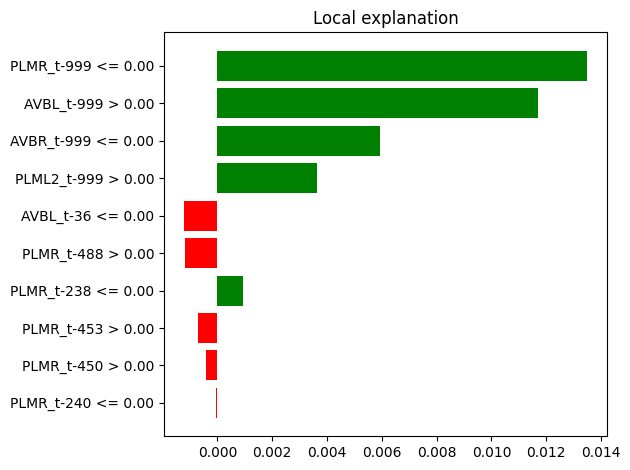

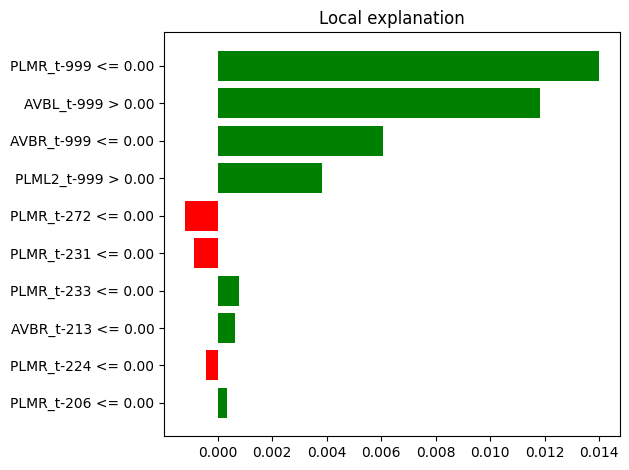

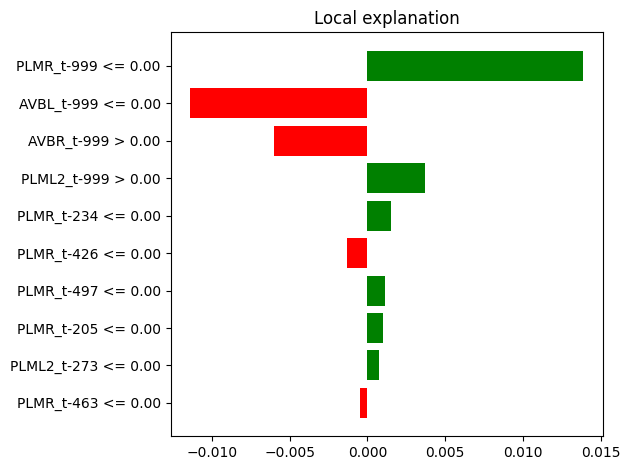

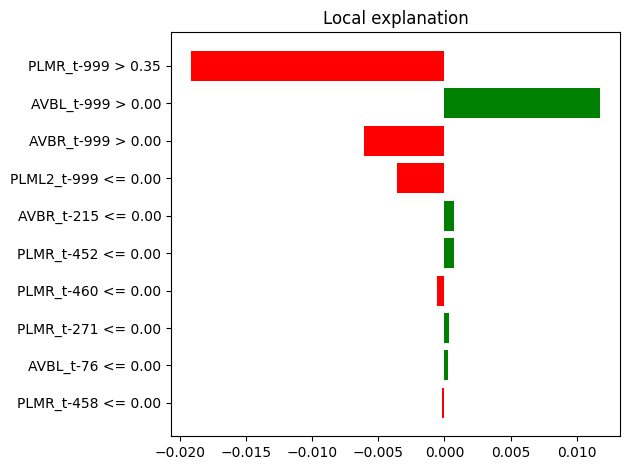

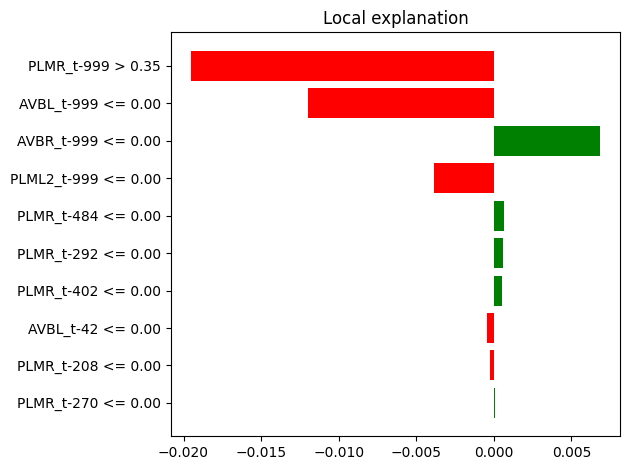

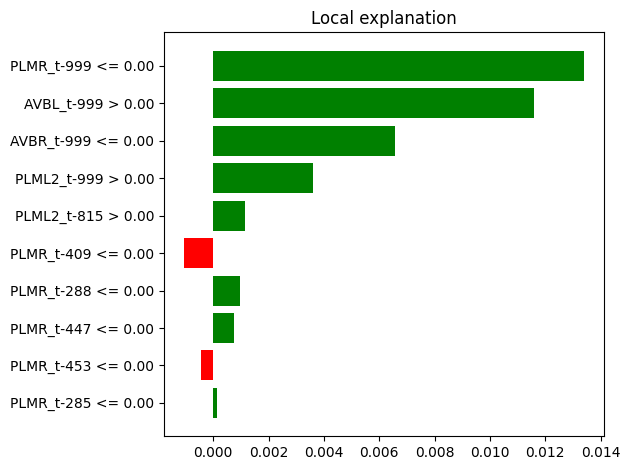

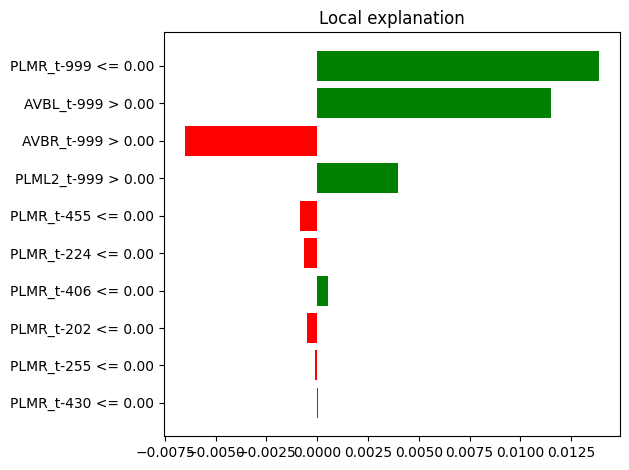

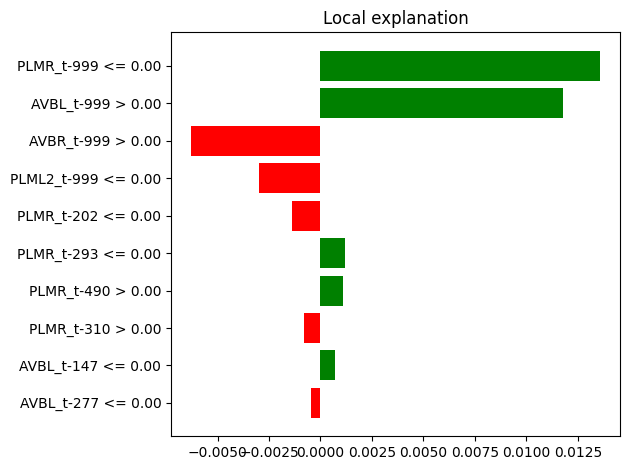

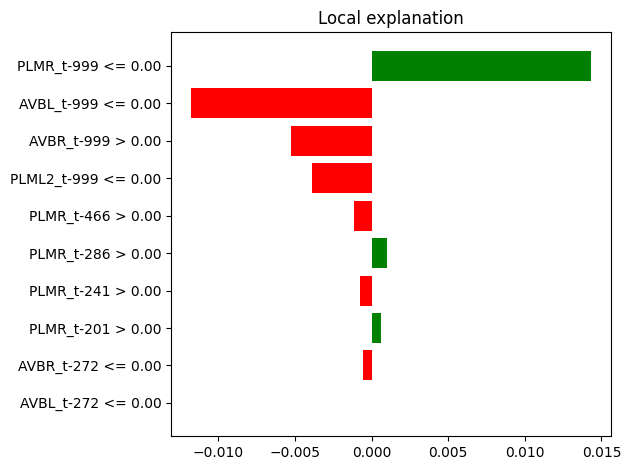

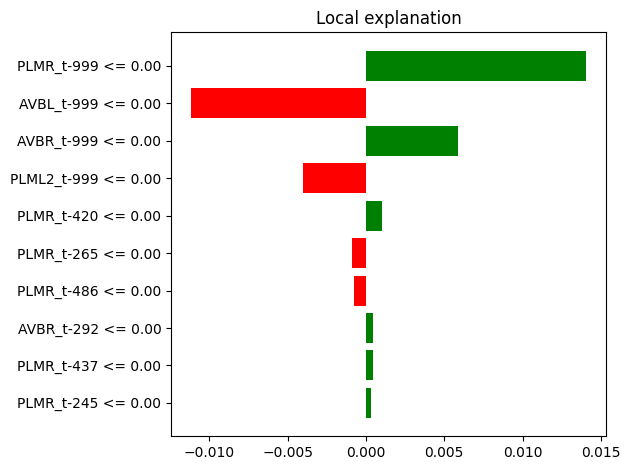

In [16]:
for i in range(len(exp_obj)):
    exp_obj[i].as_pyplot_figure()
    plt.tight_layout()

#### list of features and conditions from the 10 X_test instances

In [17]:
exp_features_conditions = []
for i in range(len(exp)):
    exp_features_conditions.append(exp[i][0])

In [18]:
# exp_features_conditions

#### frequency of  features and conditions combinations

In [19]:
exp_features_conditions_dict = Counter(exp_features_conditions)

In [20]:
exp_features_conditions_dict.most_common()

[('PLMR_t-999 <= 0.00', 8),
 ('AVBL_t-999 > 0.00', 6),
 ('AVBR_t-999 <= 0.00', 5),
 ('PLML2_t-999 > 0.00', 5),
 ('AVBR_t-999 > 0.00', 5),
 ('PLML2_t-999 <= 0.00', 5),
 ('AVBL_t-999 <= 0.00', 4),
 ('PLMR_t-224 <= 0.00', 2),
 ('PLMR_t-999 > 0.35', 2),
 ('PLMR_t-202 <= 0.00', 2),
 ('AVBL_t-36 <= 0.00', 1),
 ('PLMR_t-488 > 0.00', 1),
 ('PLMR_t-238 <= 0.00', 1),
 ('PLMR_t-453 > 0.00', 1),
 ('PLMR_t-450 > 0.00', 1),
 ('PLMR_t-240 <= 0.00', 1),
 ('PLMR_t-272 <= 0.00', 1),
 ('PLMR_t-231 <= 0.00', 1),
 ('PLMR_t-233 <= 0.00', 1),
 ('AVBR_t-213 <= 0.00', 1),
 ('PLMR_t-206 <= 0.00', 1),
 ('PLMR_t-234 <= 0.00', 1),
 ('PLMR_t-426 <= 0.00', 1),
 ('PLMR_t-497 <= 0.00', 1),
 ('PLMR_t-205 <= 0.00', 1),
 ('PLML2_t-273 <= 0.00', 1),
 ('PLMR_t-463 <= 0.00', 1),
 ('AVBR_t-215 <= 0.00', 1),
 ('PLMR_t-452 <= 0.00', 1),
 ('PLMR_t-460 <= 0.00', 1),
 ('PLMR_t-271 <= 0.00', 1),
 ('AVBL_t-76 <= 0.00', 1),
 ('PLMR_t-458 <= 0.00', 1),
 ('PLMR_t-484 <= 0.00', 1),
 ('PLMR_t-292 <= 0.00', 1),
 ('PLMR_t-402 <= 0.00', 1)

#### list of features

In [21]:
exp_features = []
for i in range(len(exp_features_conditions)):
    exp_features.append(exp_features_conditions[i].split("_")[0])
    if len(exp_features[-1]) > 5:
        exp_features[-1] = exp_features[-1].split(" ")[-1]

In [22]:
# exp_features

#### frequency of features

In [23]:
exp_features_dict = Counter(exp_features)

In [24]:
exp_features_dict.most_common()

[('PLMR', 58), ('AVBL', 16), ('AVBR', 14), ('PLML2', 12)]

#### list of values

In [25]:
exp_values = []
for i in range(len(exp)):
    exp_values.append(exp[i][1])

In [26]:
# exp_values

#### list of values sorted

In [27]:
exp_values_sorted = sorted(exp_values, key=abs, reverse=True)

In [28]:
# exp_values_sorted

#### dataset visualization

In [29]:
with np.printoptions(threshold=np.inf):
    print(X_test[0])

[[1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.3 0. ]
 [1.4 0.  2.

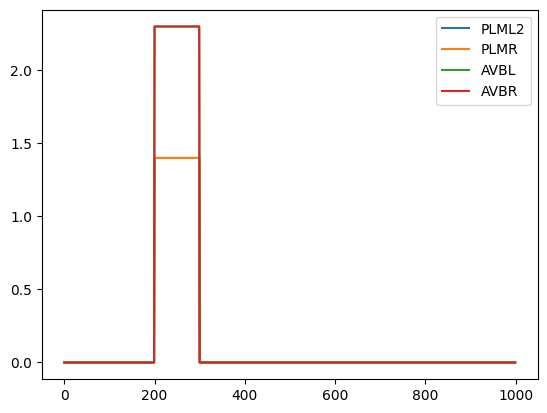

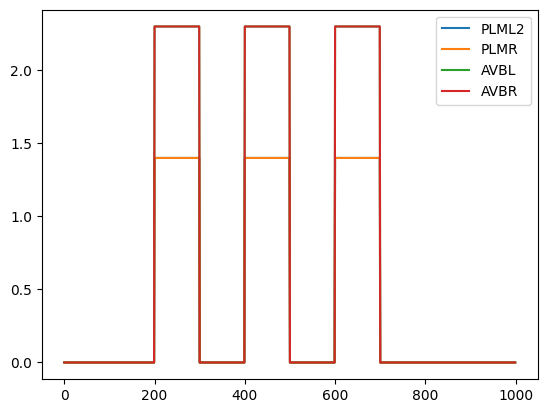

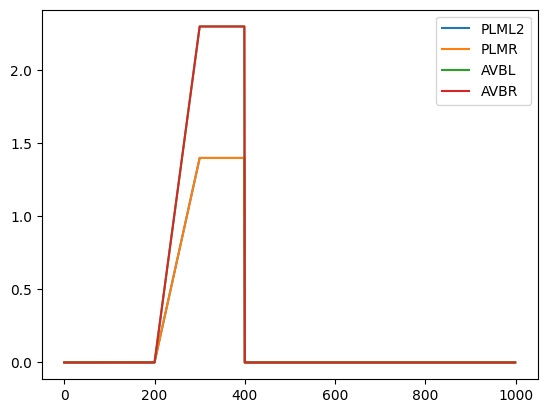

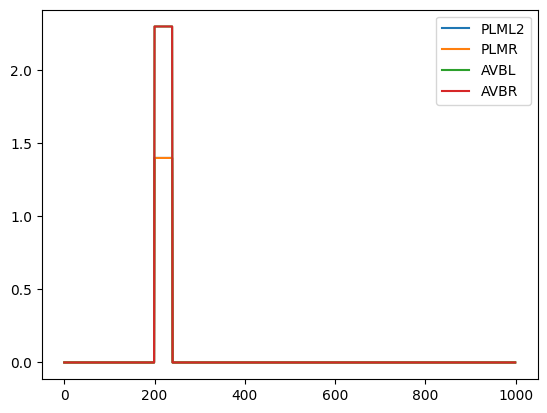

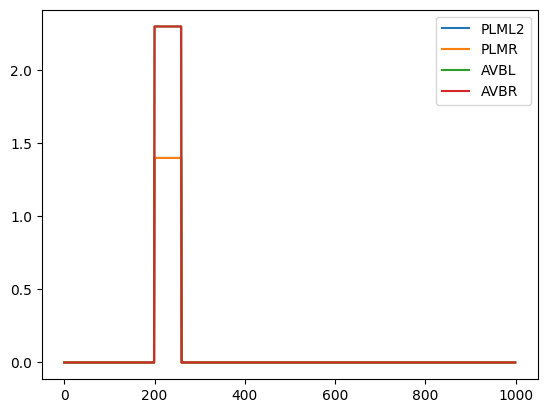

...

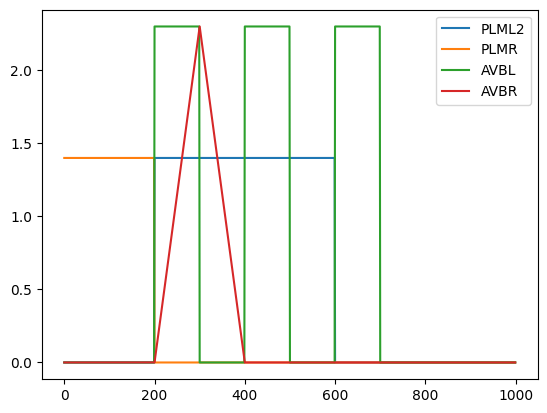

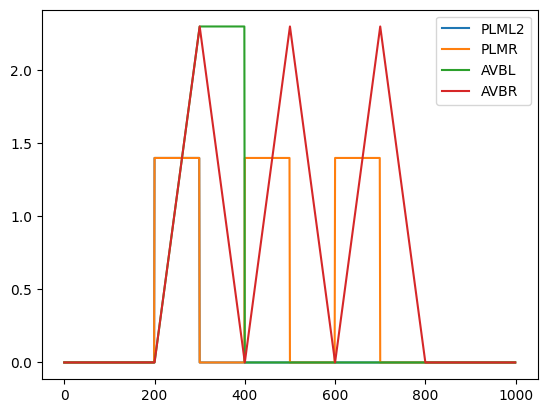

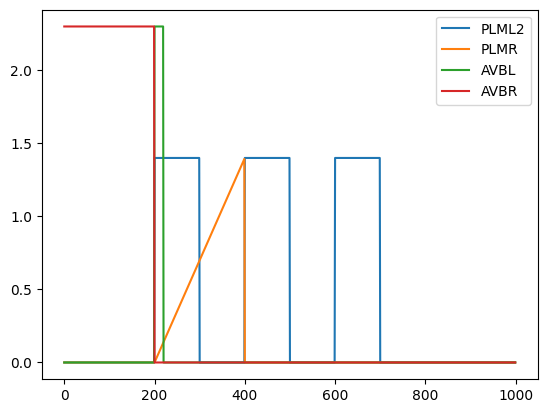

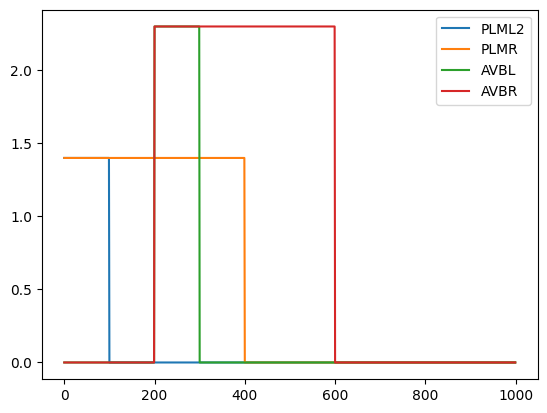

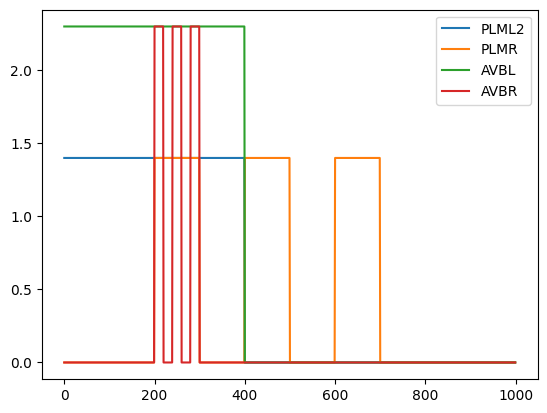

In [30]:
for i in range(len(X_train)):
    plt.plot(X_train[i])
    plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
    plt.show()

              Feature  Contribution
0  PLMR_t-999 <= 0.00      0.013478
1   AVBL_t-999 > 0.00      0.011691
2  AVBR_t-999 <= 0.00      0.005937
3  PLML2_t-999 > 0.00      0.003625
4   AVBL_t-36 <= 0.00     -0.001215
5   PLMR_t-488 > 0.00     -0.001183
6  PLMR_t-238 <= 0.00      0.000934
7   PLMR_t-453 > 0.00     -0.000707
8   PLMR_t-450 > 0.00     -0.000434
9  PLMR_t-240 <= 0.00     -0.000046


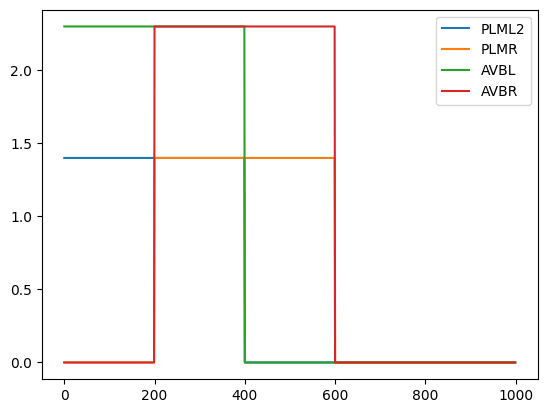

              Feature  Contribution
0  PLMR_t-999 <= 0.00      0.014006
1   AVBL_t-999 > 0.00      0.011817
2  AVBR_t-999 <= 0.00      0.006081
3  PLML2_t-999 > 0.00      0.003822
4  PLMR_t-272 <= 0.00     -0.001208
5  PLMR_t-231 <= 0.00     -0.000885
6  PLMR_t-233 <= 0.00      0.000769
7  AVBR_t-213 <= 0.00      0.000617
8  PLMR_t-224 <= 0.00     -0.000416
9  PLMR_t-206 <= 0.00      0.000349


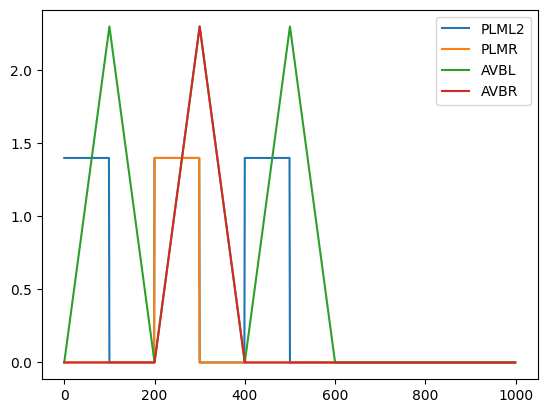

               Feature  Contribution
0   PLMR_t-999 <= 0.00      0.013894
1   AVBL_t-999 <= 0.00     -0.011392
2    AVBR_t-999 > 0.00     -0.006001
3   PLML2_t-999 > 0.00      0.003705
4   PLMR_t-234 <= 0.00      0.001533
5   PLMR_t-426 <= 0.00     -0.001308
6   PLMR_t-497 <= 0.00      0.001148
7   PLMR_t-205 <= 0.00      0.001035
8  PLML2_t-273 <= 0.00      0.000728
9   PLMR_t-463 <= 0.00     -0.000468


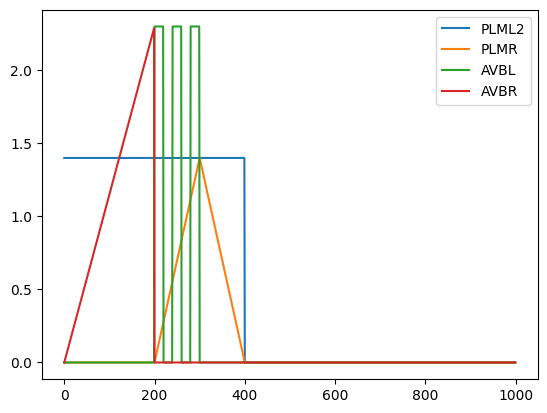

               Feature  Contribution
0    PLMR_t-999 > 0.35     -0.019109
1    AVBL_t-999 > 0.00      0.011721
2    AVBR_t-999 > 0.00     -0.006103
3  PLML2_t-999 <= 0.00     -0.003553
4   AVBR_t-215 <= 0.00      0.000722
5   PLMR_t-452 <= 0.00      0.000715
6   PLMR_t-460 <= 0.00     -0.000550
7   PLMR_t-271 <= 0.00      0.000326
8    AVBL_t-76 <= 0.00      0.000269
9   PLMR_t-458 <= 0.00     -0.000199


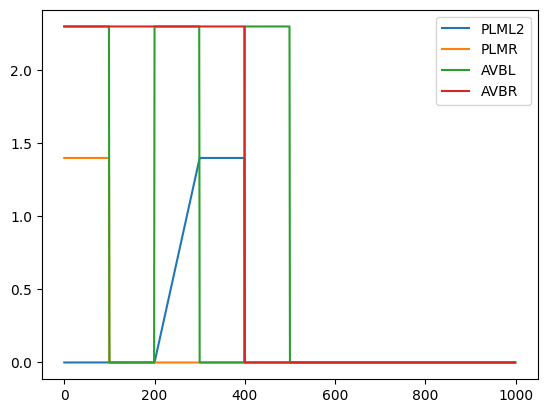

               Feature  Contribution
0    PLMR_t-999 > 0.35     -0.019493
1   AVBL_t-999 <= 0.00     -0.011988
2   AVBR_t-999 <= 0.00      0.006811
3  PLML2_t-999 <= 0.00     -0.003830
4   PLMR_t-484 <= 0.00      0.000658
5   PLMR_t-292 <= 0.00      0.000596
6   PLMR_t-402 <= 0.00      0.000509
7    AVBL_t-42 <= 0.00     -0.000418
8   PLMR_t-208 <= 0.00     -0.000280
9   PLMR_t-270 <= 0.00      0.000096


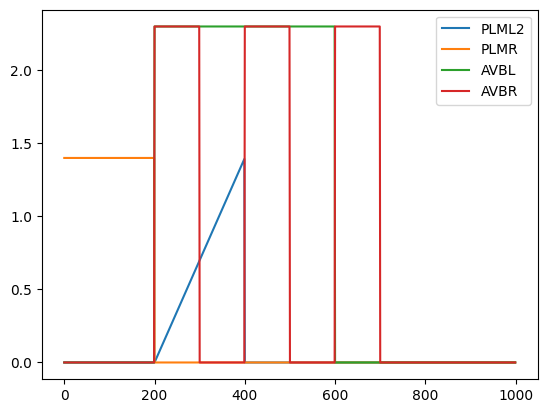

              Feature  Contribution
0  PLMR_t-999 <= 0.00      0.013411
1   AVBL_t-999 > 0.00      0.011596
2  AVBR_t-999 <= 0.00      0.006577
3  PLML2_t-999 > 0.00      0.003591
4  PLML2_t-815 > 0.00      0.001138
5  PLMR_t-409 <= 0.00     -0.001051
6  PLMR_t-288 <= 0.00      0.000965
7  PLMR_t-447 <= 0.00      0.000755
8  PLMR_t-453 <= 0.00     -0.000434
9  PLMR_t-285 <= 0.00      0.000153


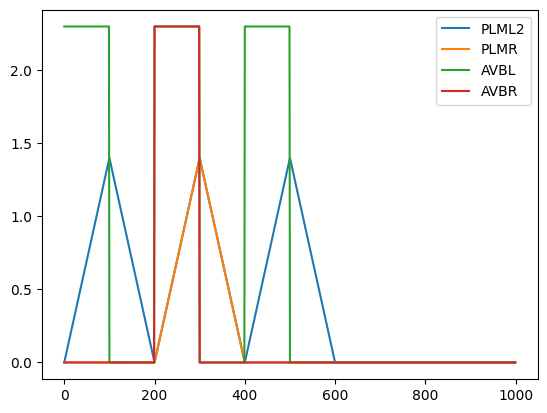

              Feature  Contribution
0  PLMR_t-999 <= 0.00      0.013882
1   AVBL_t-999 > 0.00      0.011518
2   AVBR_t-999 > 0.00     -0.006520
3  PLML2_t-999 > 0.00      0.003963
4  PLMR_t-455 <= 0.00     -0.000829
5  PLMR_t-224 <= 0.00     -0.000647
6  PLMR_t-406 <= 0.00      0.000519
7  PLMR_t-202 <= 0.00     -0.000498
8  PLMR_t-255 <= 0.00     -0.000097
9  PLMR_t-430 <= 0.00      0.000022


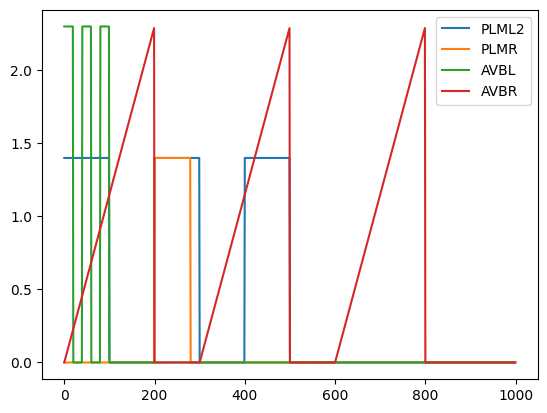

               Feature  Contribution
0   PLMR_t-999 <= 0.00      0.013549
1    AVBL_t-999 > 0.00      0.011790
2    AVBR_t-999 > 0.00     -0.006268
3  PLML2_t-999 <= 0.00     -0.002981
4   PLMR_t-202 <= 0.00     -0.001381
5   PLMR_t-293 <= 0.00      0.001177
6    PLMR_t-490 > 0.00      0.001102
7    PLMR_t-310 > 0.00     -0.000816
8   AVBL_t-147 <= 0.00      0.000693
9   AVBL_t-277 <= 0.00     -0.000457


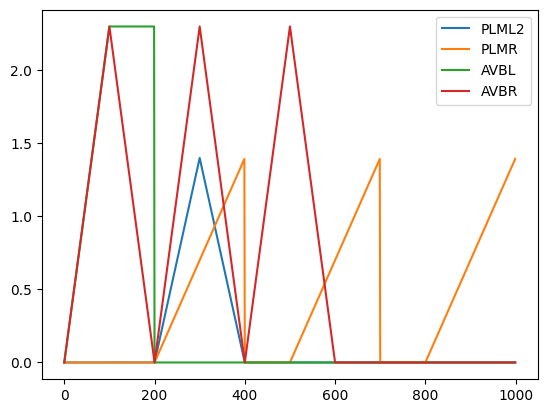

               Feature  Contribution
0   PLMR_t-999 <= 0.00      0.014310
1   AVBL_t-999 <= 0.00     -0.011778
2    AVBR_t-999 > 0.00     -0.005243
3  PLML2_t-999 <= 0.00     -0.003869
4    PLMR_t-466 > 0.00     -0.001120
5    PLMR_t-286 > 0.00      0.001036
6    PLMR_t-241 > 0.00     -0.000731
7    PLMR_t-201 > 0.00      0.000645
8   AVBR_t-272 <= 0.00     -0.000576
9   AVBL_t-272 <= 0.00      0.000045


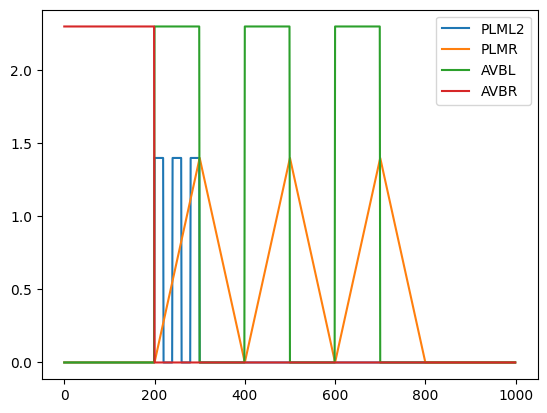

               Feature  Contribution
0   PLMR_t-999 <= 0.00      0.014065
1   AVBL_t-999 <= 0.00     -0.011181
2   AVBR_t-999 <= 0.00      0.005846
3  PLML2_t-999 <= 0.00     -0.004017
4   PLMR_t-420 <= 0.00      0.001019
5   PLMR_t-265 <= 0.00     -0.000903
6   PLMR_t-486 <= 0.00     -0.000774
7   AVBR_t-292 <= 0.00      0.000445
8   PLMR_t-437 <= 0.00      0.000444
9   PLMR_t-245 <= 0.00      0.000338


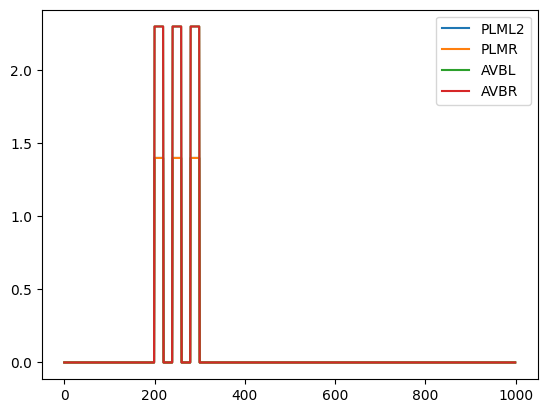

In [31]:
for i in range(len(X_test)):
    print(pd.DataFrame(exp_obj[i].as_list(), columns=['Feature','Contribution']))
#     print(exp_obj[i].as_list())
    plt.plot(X_test[i])
    plt.legend(['PLML2', 'PLMR', 'AVBL', 'AVBR'])
    plt.show()